In [1]:
import os
import glob

import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import seaborn as sns

from helper_functions import chessboard_images, extract_corners
from calibration import calibration


In [2]:
pattern_size=(5, 8)
images = chessboard_images('/workspace/test_images')

['/workspace/test_images/Ladybug1.jpg', '/workspace/test_images/Ladybug10.jpg', '/workspace/test_images/Ladybug11.jpg', '/workspace/test_images/Ladybug12.jpg', '/workspace/test_images/Ladybug13.jpg', '/workspace/test_images/Ladybug2.jpg', '/workspace/test_images/Ladybug3.jpg', '/workspace/test_images/Ladybug4.jpg', '/workspace/test_images/Ladybug5.jpg', '/workspace/test_images/Ladybug6.jpg', '/workspace/test_images/Ladybug7.jpg', '/workspace/test_images/Ladybug8.jpg', '/workspace/test_images/Ladybug9.jpg']


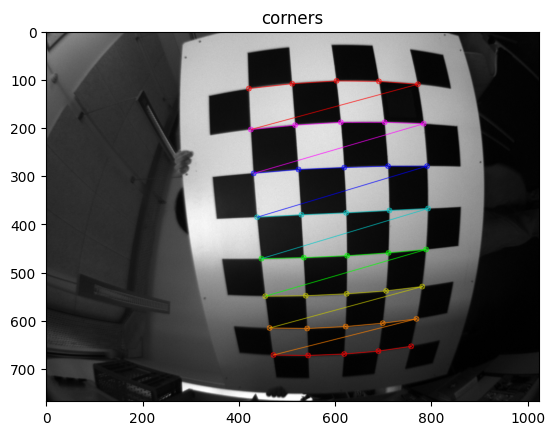

In [3]:
# Test corner extraction
image = cv.imread('/workspace/test_images/Ladybug2.jpg')
corners = extract_corners(image, pattern_size)

if corners is not None:
    cv.drawChessboardCorners(image, pattern_size, corners, True)       
    plt.title('corners')
    plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
    plt.show()

In [4]:
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.
image_size = (images[-1].shape[0], images[-1].shape[1])
_objpoints = np.zeros((pattern_size[0] * pattern_size[1] ,3), np.float32)
_objpoints[:,:2] = np.mgrid[:pattern_size[0],:pattern_size[1]].T.reshape(-1,2)
for img in images:
    corners = extract_corners(img, pattern_size)
    if corners is not None:
        objpoints.append(_objpoints)
        imgpoints.append(corners)

objpoints = np.array(objpoints)
imgpoints = np.array(imgpoints)

In [5]:
mtx, dist, rvecs, tvecs, param_history = calibration(objpoints, imgpoints, niter=20)

Defining sympy symbols
Calculating jacobian and residual of objective over params
Optimizing params


  5%|▌         | 1/20 [00:05<01:39,  5.24s/it]

[iter 0] residual: 114066.2045987664)


 10%|█         | 2/20 [00:10<01:32,  5.11s/it]

[iter 1] residual: 53027.16787630863)


 15%|█▌        | 3/20 [00:15<01:25,  5.05s/it]

[iter 2] residual: 23644.218684439733)


 20%|██        | 4/20 [00:20<01:21,  5.11s/it]

[iter 3] residual: 12390.692600045248)


 25%|██▌       | 5/20 [00:25<01:16,  5.08s/it]

[iter 4] residual: 6915.836704887717)


 30%|███       | 6/20 [00:30<01:10,  5.06s/it]

[iter 5] residual: 3928.991946269417)


 35%|███▌      | 7/20 [00:35<01:06,  5.08s/it]

[iter 6] residual: 2165.4585440202154)


 40%|████      | 8/20 [00:40<01:00,  5.08s/it]

[iter 7] residual: 1196.815425368777)


 45%|████▌     | 9/20 [00:45<00:55,  5.09s/it]

[iter 8] residual: 678.9802733309225)


 50%|█████     | 10/20 [00:50<00:50,  5.06s/it]

[iter 9] residual: 461.1074075204159)


 55%|█████▌    | 11/20 [00:55<00:45,  5.05s/it]

[iter 10] residual: 340.70499709532555)


 60%|██████    | 12/20 [01:00<00:40,  5.04s/it]

[iter 11] residual: 322.1214930554436)


 65%|██████▌   | 13/20 [01:05<00:35,  5.04s/it]

[iter 12] residual: 321.3032434889702)


 70%|███████   | 14/20 [01:10<00:30,  5.03s/it]

[iter 13] residual: 329.5149424024878)


 75%|███████▌  | 15/20 [01:15<00:25,  5.02s/it]

[iter 14] residual: 291.52874717631465)


 80%|████████  | 16/20 [01:20<00:20,  5.05s/it]

[iter 15] residual: 323.675279548007)


 85%|████████▌ | 17/20 [01:26<00:15,  5.10s/it]

[iter 16] residual: 296.26985678061675)


 90%|█████████ | 18/20 [01:31<00:10,  5.10s/it]

[iter 17] residual: 315.12201811208695)


 95%|█████████▌| 19/20 [01:36<00:05,  5.11s/it]

[iter 18] residual: 291.7586980206571)


100%|██████████| 20/20 [01:41<00:00,  5.07s/it]

[iter 19] residual: 321.11108817139313)


Final residual: 284.9149281556476)


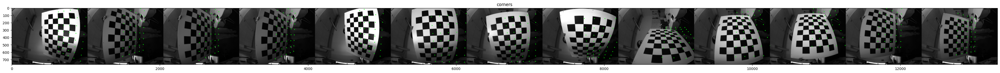

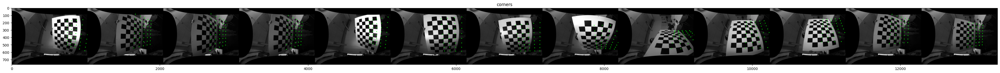

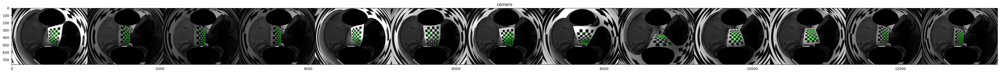

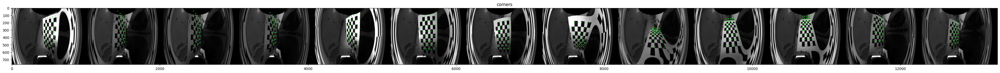

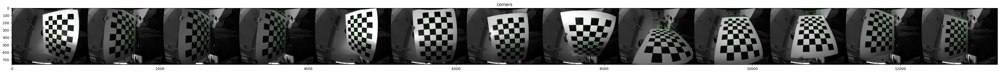

...

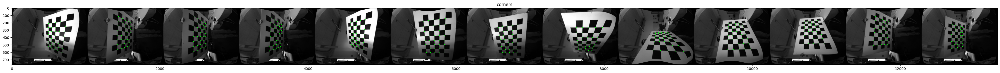

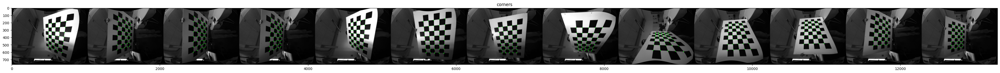

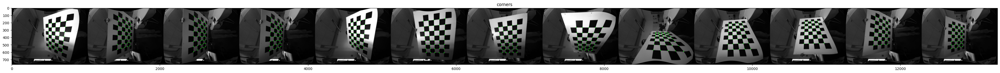

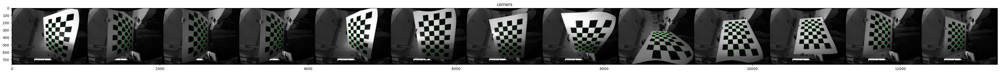

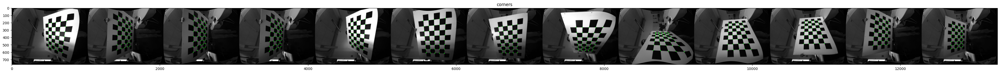

In [8]:
from tqdm import tqdm
import scipy.linalg as la
plt.rcParams["figure.figsize"] = (50,30)

N = len(objpoints)
M = len(objpoints[0])

for i, params in enumerate(param_history):
                mtx, dist, rvecs, tvecs = params
                projected_images = []
                for n in range(N):
                        img = images[n]
                        h,  w = img.shape[:2]
                        newcameramtx, roi = cv.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))

                        # undistort
                        mapx, mapy = cv.initUndistortRectifyMap(mtx, dist, None, newcameramtx, (w,h), 5)
                        dst = cv.remap(img, mapx, mapy, cv.INTER_LINEAR)

                        # project point
                        image_points, jac = cv.projectPoints(objpoints[n], rvecs[n], tvecs[n], newcameramtx, np.zeros([1, 14]))
                        image_points = np.int32(image_points).reshape(-1,2)

                        for img_point in image_points:
                                cv.circle(dst, tuple(img_point), 5, (0, 255, 0), -1)
                        projected_images.append(dst)
                        
                display = cv.hconcat([img for img in projected_images])
                plt.title(f'{i}th iteration')
                plt.imshow(cv.cvtColor(display, cv.COLOR_BGR2RGB))
                plt.show()
        

# update